In [16]:
import pertpy as pt
import pickle as pkl
import scanpy as sc
import pandas as pd
import numpy as np 
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import seaborn as sns
from scipy import stats
from scipy import sparse 
from statsmodels.sandbox.stats.multicomp import multipletests


In [2]:
%load_ext autoreload
%autoreload 2

import importlib
importlib.reload(pt)

Installed version 0.4.0 of pertpy is outdated. Newest version is 0.5.0!

<module 'pertpy' from '/Users/tessa/miniforge3/envs/pertpy5/lib/python3.9/site-packages/pertpy/__init__.py'>

In [3]:
def test_association(adata, celltype_label = "Cluster", sample_label="Sample", condition_label = "Efficacy", conditions_compare = ("PR","SD")): 
    pvals = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    tstats = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    response = adata.obs.groupby(sample_label)[condition_label].agg(pd.Series.mode)
    res = dict()
    for celltype in adata.obs[celltype_label].unique().tolist():
        df = adata.obs[adata.obs[celltype_label]==celltype]

        for mcpnum in ["mcp_"+str(n) for n in range(0,10)]:
            mns = df.groupby(sample_label)[mcpnum].mean()
            mns = pd.concat([mns,response],axis=1)
            res = stats.ttest_ind(mns[mns[condition_label]==conditions_compare[0]][mcpnum],mns[mns[condition_label]==conditions_compare[1]][mcpnum])
            pvals.loc[celltype, mcpnum]=res[1]
            tstats.loc[celltype, mcpnum]=res[0]
    return pvals,tstats

In [4]:
def plot_split_violins(adata, mcp = "mcp_0", split="Efficacy", celltype_key = "Cluster"):
    df = sc.get.obs_df(adata, [celltype_key,mcp, split])
  

    p2 = sns.violinplot(data=df, x=celltype_key,y=mcp,hue=split, split=True)
    p2.set_xticklabels(p2.get_xticklabels(), rotation=45)


In [5]:
def mcp_pairsplot(adata, celltype_key = "Cluster", color = "Efficacy", mcp = "mcp_0", sample_key = "Sample"):
    mean_mcps = adata.obs.groupby([sample_key,celltype_key])[mcp].mean()
    mean_mcps = mean_mcps.reset_index()
    mcp_pivot = pd.pivot(mean_mcps[[sample_key,celltype_key,mcp]],index=sample_key,columns = celltype_key )[mcp]
    mcp_pivot = pd.concat([mcp_pivot,adata.obs.groupby([sample_key]).agg(pd.Series.mode)[color]],axis=1)
    sns.pairplot(mcp_pivot, corner=True, hue=color)
    

In [6]:
df = sc.read_mtx("data/zhang_just_counts.mtx")

In [94]:
# read gene names

adata = ad.AnnData(np.transpose(df.X))
gene_names = pd.read_csv("data/zhang_just_counts.genes.csv", index_col=0)
adata.var_names = gene_names.x.values

# read barcodes
barcodes = pd.read_csv("data/zhang_just_counts.barcodes.csv", index_col=0)
# read metadata
adata.obs_names = barcodes.x
# create AnnData object 

In [96]:
adata

AnnData object with n_obs × n_vars = 489490 × 27085

In [97]:
#metadata = pd.read_csv("data/metadata.csv", index_col=0)
#(metadata.index == adata.obs_names).sum()

zhang=  sc.read_h5ad("zhang_with_PCs.h5ad")

In [103]:
np.sum(zhang.obs.index == adata.obs_names)

489490

In [104]:
adata.obs = zhang.obs

In [105]:
adata

AnnData object with n_obs × n_vars = 489490 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [106]:
# pre-processing (no filtering but should calc QC metrics)

In [107]:
#  adata.raw.to_adata()

In [108]:
adata

AnnData object with n_obs × n_vars = 489490 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [109]:
# tumor samples only
adata = adata[adata.obs['Origin']=="t" ,:].copy()

In [110]:
# pre-treatment samples only 
adata = adata[adata.obs['Sample'].str.contains('Pre'),:].copy()

In [111]:
# isecs = adata.obs.groupby(["Cluster", "Sample"]).size()
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

(array([ 5.,  8.,  6.,  1.,  8.,  3., 10.,  4.,  7.,  5.]),
 array([ 0. ,  1.5,  3. ,  4.5,  6. ,  7.5,  9. , 10.5, 12. , 13.5, 15. ]),
 <BarContainer object of 10 artists>)

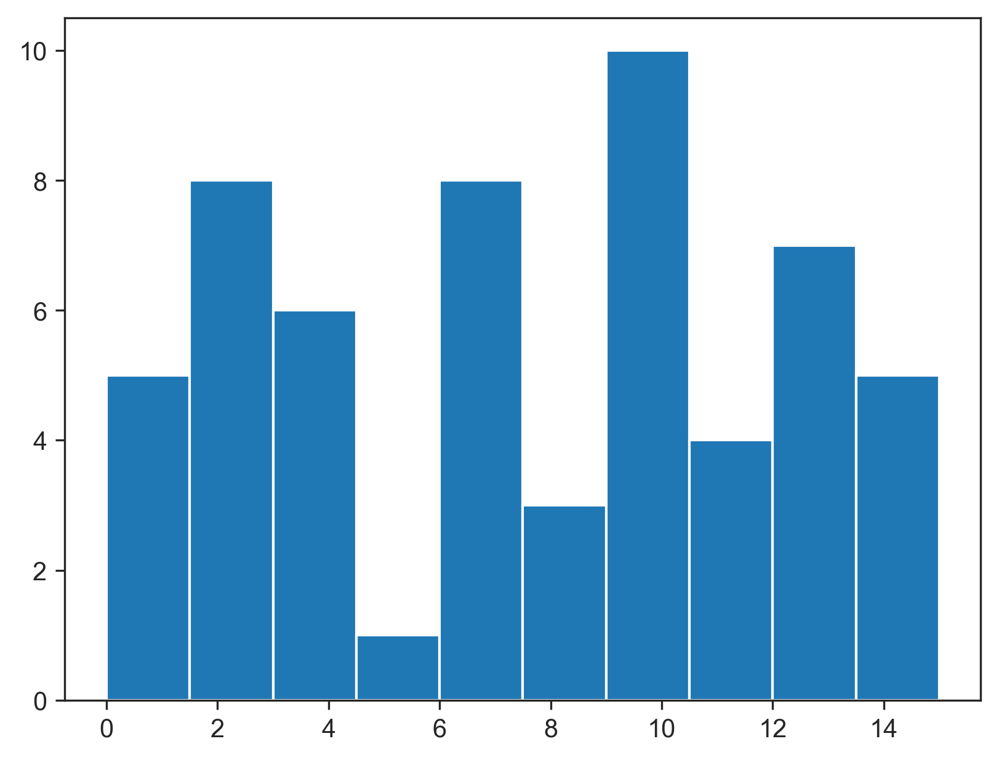

In [112]:
plt.hist((isecs >3).sum(axis=1))

In [113]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]]

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_pB-IGHG1,679,8,12,12,4,301,4,136,14,238,1753,911,1083,206,283


In [114]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-1]

# drop sample Pre_P010_t 

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_CD4_Tcm-LMNA,4,392,569,249,0,288,6,311,20,134,555,77,593,444,87
t_CD4_Treg-FOXP3,13,338,110,62,0,464,24,419,17,518,769,743,398,122,130
t_CD8_Tem-GZMK,8,957,368,72,0,417,17,176,21,154,2354,202,709,891,292
t_Tn-LEF1,11,98,110,3494,0,1269,22,50,609,167,4010,175,1501,388,271


In [115]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-2]
# drop Pre_P013_t, Pre_P017_t, Pre_P002_2

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_Bmem-CD27,377,11,12,105,0,1950,0,11,166,22,4210,132,309,121,400
t_CD8_MAIT-KLRB1,0,51,1244,45,0,40,7,84,24,19,67,14,38,20,11
t_CD8_Trm-ZNF683,3,76,180,71,0,143,4,407,4,226,422,121,449,219,150
t_mono-FCN1,4,60,11,12,0,14,23,44,1,31,43,15,51,33,16


In [116]:
isecs

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
Mix,4146,0,0,0,0,0,0,0,0,0,0,0,0,0,0
t_Bfoc-MKI67,0,3,0,9,0,42,2,0,0,0,1125,2,131,7,2
t_Bfoc-NEIL1,1,0,0,1,0,29,0,0,0,0,633,3,119,8,1
t_Bmem-CD27,377,11,12,105,0,1950,0,11,166,22,4210,132,309,121,400
t_Bmem-MKI67,28,0,0,2,0,40,0,1,3,0,27,6,1,4,4
t_Bn-TCL1A,5,3,21,143,0,672,0,6,9,2,6606,48,262,26,45
t_CD4-CXCL13,6,10,16,88,0,315,3,129,0,59,1852,413,301,164,171
t_CD4_Tact-XIST,18,63,61,1,0,275,0,6,9,2,84,35,593,44,4067
t_CD4_Tcm-LMNA,4,392,569,249,0,288,6,311,20,134,555,77,593,444,87


In [117]:
celltypes = list(isecs[(isecs > 3).sum(axis=1) >= np.shape(isecs)[1]-2].index.values)

In [118]:
# subset to cell types with sufficient expression
adata = adata[adata.obs['Cluster'].isin(celltypes),:].copy()

In [119]:
adata

AnnData object with n_obs × n_vars = 44636 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [120]:
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

In [121]:
keep_pts = list(isecs.loc[:,(isecs > 3).sum(axis=0) == isecs.shape[0]].columns.values)

In [122]:
adata = adata[adata.obs['Sample'].isin(keep_pts),:].copy()

In [123]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=1)

Cluster
t_Bmem-CD27         11
t_CD4_Tcm-LMNA      77
t_CD4_Treg-FOXP3    62
t_CD8_MAIT-KLRB1    11
t_CD8_Tem-GZMK      72
t_CD8_Trm-ZNF683    71
t_Tn-LEF1           50
t_mono-FCN1         11
t_pB-IGHG1           8
dtype: int64

In [124]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=0)

Sample
Pre_P004_t     8
Pre_P005_t    11
Pre_P007_t    12
Pre_P012_t    14
Pre_P016_t    11
Pre_P018_t    19
Pre_P019_t    43
Pre_P020_t    14
Pre_P022_t    38
Pre_P023_t    20
Pre_P025_t    11
dtype: int64

In [125]:
# cell counts look passable (though definitely low for some -- could consider dropping more things)

In [126]:
adata

AnnData object with n_obs × n_vars = 42550 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [127]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata.raw = adata


In [128]:
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)


In [129]:
sc.tl.pca(adata)

In [130]:
adata.obsm['X_pca'].shape

(42550, 50)

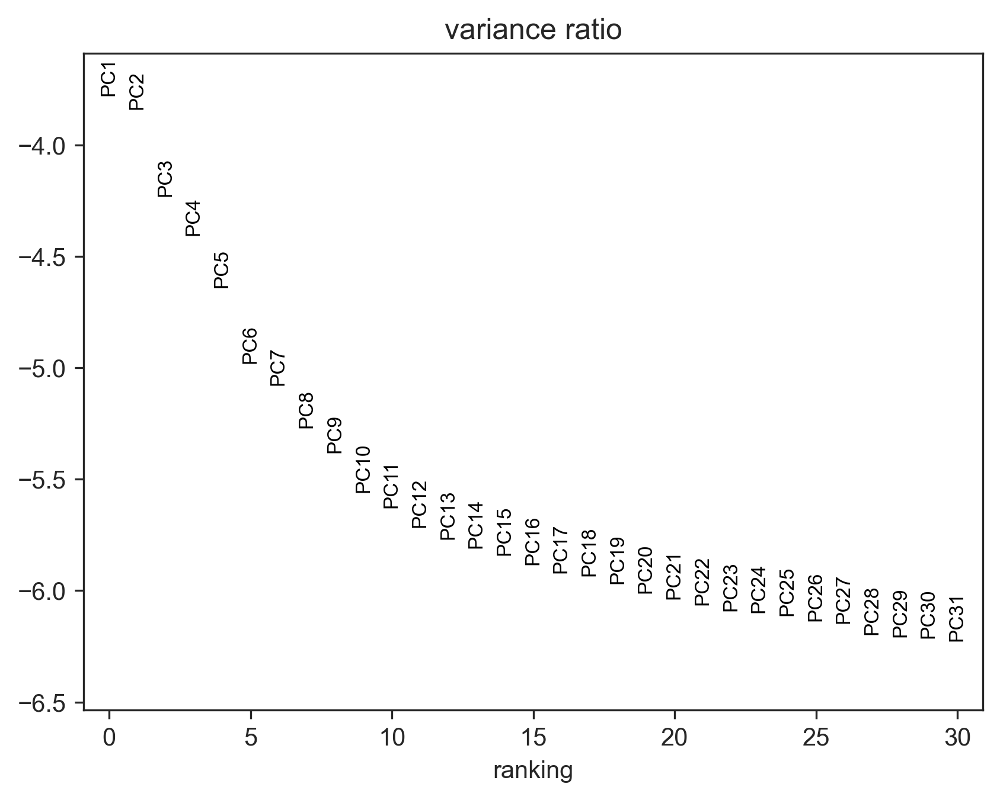

In [131]:
sc.pl.pca_variance_ratio(adata, log=True)


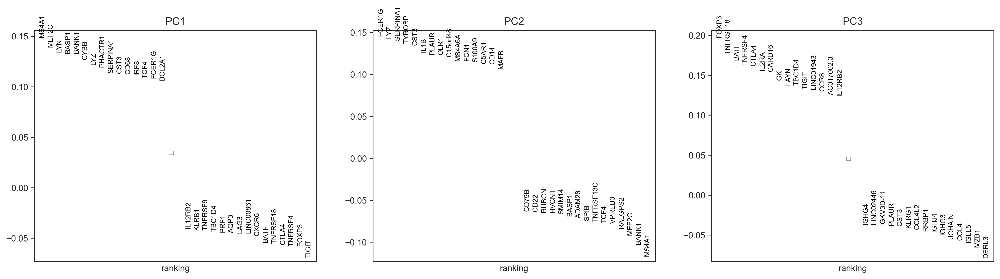

In [132]:
sc.pl.pca_loadings(adata)

In [133]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# I think this stage may be re-running PCA??

In [134]:
adata

AnnData object with n_obs × n_vars = 42550 × 949
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [135]:
adata.obs.columns

Index(['Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group',
       'Treatment', 'Number of counts', 'Number of genes', 'Major celltype',
       'Cluster', 'n_genes_by_counts', 'total_counts'],
      dtype='object')

In [136]:
adata_plot = sc.pp.subsample(adata,  n_obs=10000, random_state=0, copy=True)

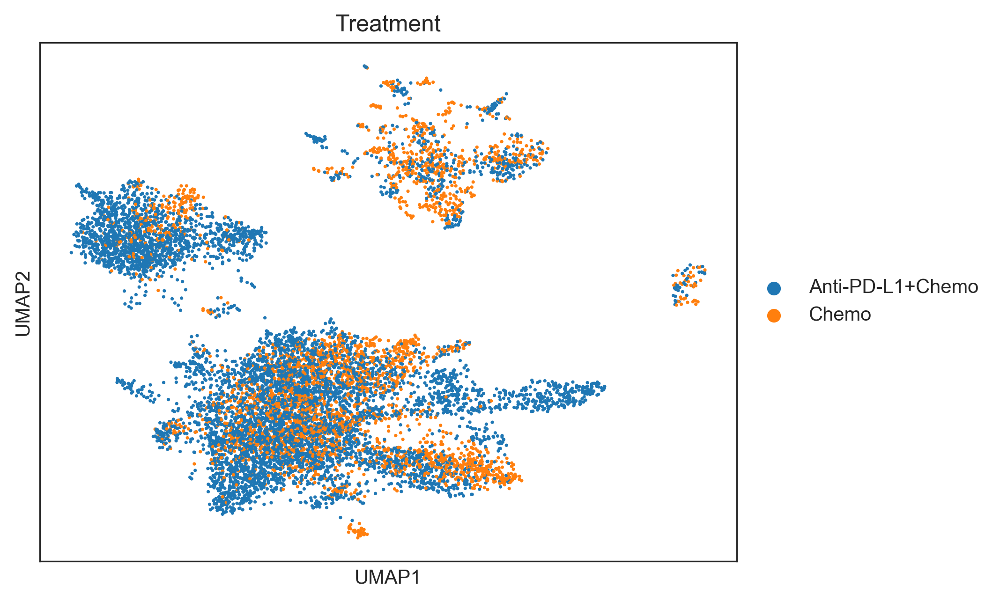

In [137]:
sc.pl.umap(
    adata_plot,
    color=[
        "Treatment"
    ],
)


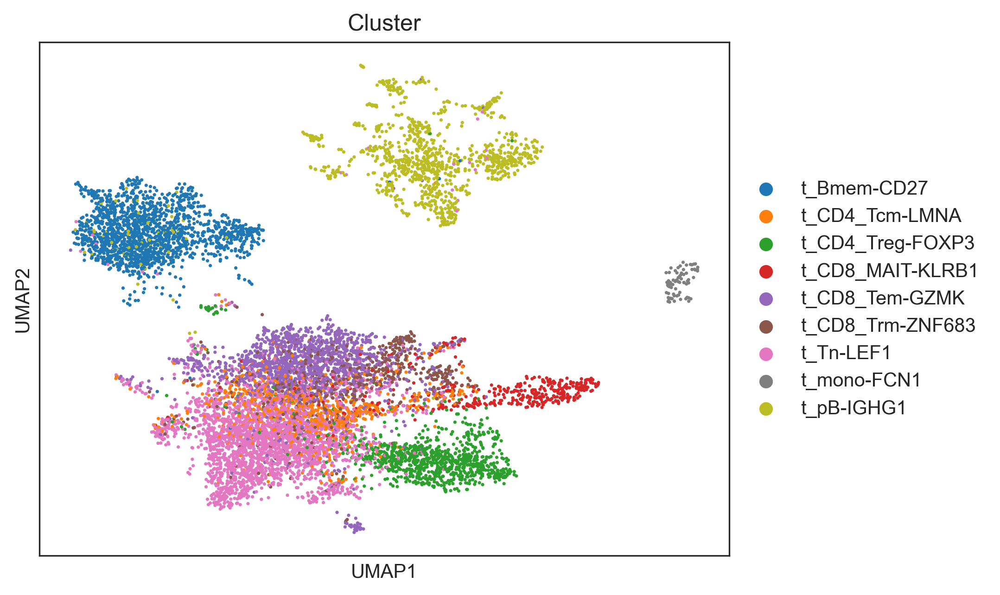

In [138]:
sc.pl.umap(
    adata_plot,
    color=[
        "Cluster"
    ],
)

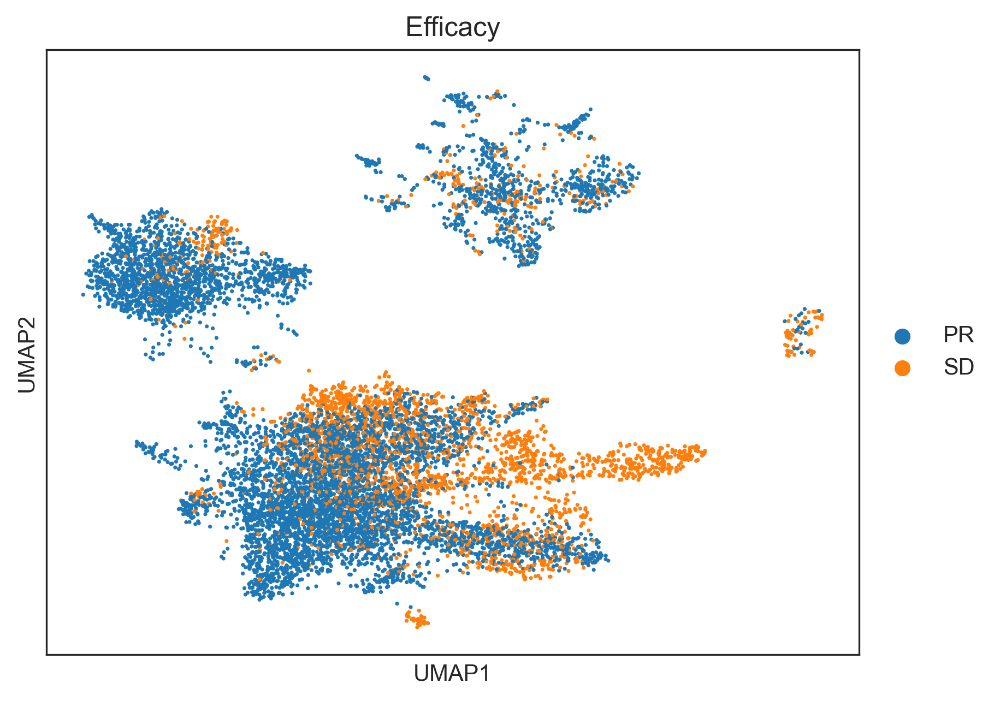

In [139]:
sc.pl.umap(
    adata_plot,
    color=[
        "Efficacy"
    ],
)

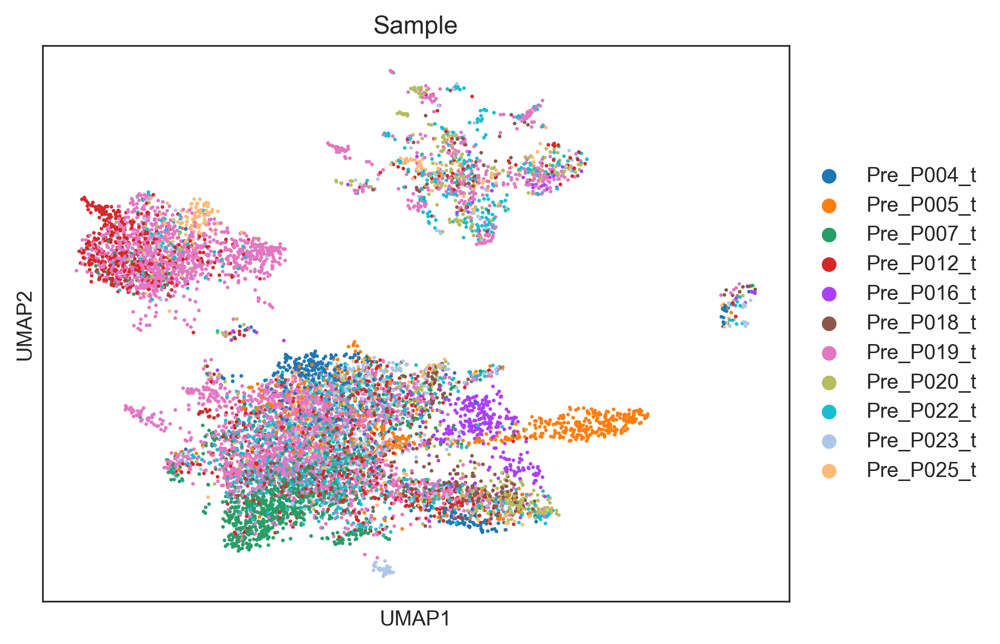

In [140]:
sc.pl.umap(
    adata_plot,
    color=[
        "Sample"
    ],
)

In [141]:
adata_lp = adata.copy()

dl_lp = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_lp, mcps_lp, ws_lp, ct_subs_lp = dl_lp.calculate_multifactor_PMD(
    adata_lp,
    normalize=True,
    solver="lp"
)

#adata, mcps, ws, ct_subs = dl.calculate_multifactor_PMD(
#    adata,
#    groupby='Sample',
#    celltype_key='Cluster',
#    mimic_dialogue=True,
#    n_components=10
#)

pvals_lp, tstats_lp = test_association(adata_lp)

In [142]:
pvals_lp.min()

mcp_0    0.381161
mcp_1    0.311431
mcp_2    0.278445
mcp_3    0.260092
mcp_4    0.248966
mcp_5    0.242909
mcp_6    0.242288
mcp_7    0.251438
mcp_8    0.268331
mcp_9    0.271896
dtype: float64

In [143]:
adata_lp

AnnData object with n_obs × n_vars = 42550 × 949
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster', 'n_genes_by_counts', 'total_counts', 'mcp_0', 'mcp_1', 'mcp_2', 'mcp_3', 'mcp_4', 'mcp_5', 'mcp_6', 'mcp_7', 'mcp_8', 'mcp_9'
    obsm: 'X_pca', 'X_umap'

In [144]:
adata_bs = adata.copy()

dl_bs = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_bs, mcps_bs, ws_bs, ct_subs_bs = dl_bs.calculate_multifactor_PMD(
    adata_bs,
    normalize=True,
    solver="bs"
)

pvals_bs, tstats_bs = test_association(adata_bs)

In [150]:
pvals_bs.min()

mcp_0    0.627790
mcp_1    0.251716
mcp_2    0.028810
mcp_3    0.101503
mcp_4    0.031023
mcp_5    0.374996
mcp_6    0.204827
mcp_7    0.052996
mcp_8    0.146899
mcp_9    0.090050
dtype: float64

In [151]:

dlg_dict = {"mcps":mcps_lp, "ws":ws_lp,"ct_subs":ct_subs_lp, "pvals":pvals_lp, "tstats":tstats_lp}
outfile =  "output/tumor_pre_DLG_normalizeTrue_lpsolver_080723.pkl"
with open(outfile, 'wb') as pickle_file:
    pkl.dump(dlg_dict, pickle_file)
pickle_file.close()


In [152]:
dlg_dict = {"mcps":mcps_bs, "ws":ws_bs,"ct_subs":ct_subs_bs, "pvals":pvals_bs, "tstats":tstats_bs}
outfile =  "output/tumor_pre_DLG_normalizeTrue_bssolver_080723.pkl"
with open(outfile, 'wb') as pickle_file:
    pkl.dump(dlg_dict, pickle_file)
pickle_file.close()

In [153]:
adata_lp.write("output/tumor_pre_DLG_normalizeTrue_lpsolver_080723.h5ad")
adata_bs.write("output/tumor_pre_DLG_normalizeTrue_bssolver_080723.h5ad")
adata.write("output/tumor_pre_DLG_PCs_080723.h5ad")

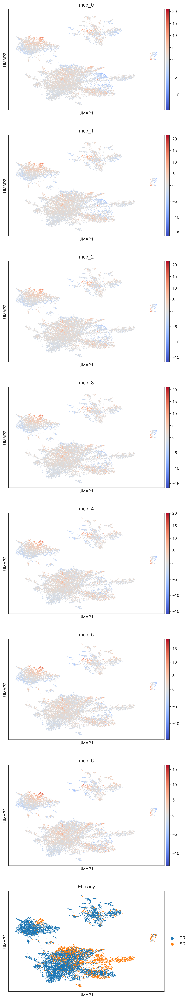

In [154]:
sc.pl.umap(adata_lp, color=["mcp_0", "mcp_1", "mcp_2","mcp_3","mcp_4","mcp_5","mcp_6","Efficacy"], ncols=1, cmap='coolwarm', vcenter=0)


In [ ]:
sc.pl.umap(adata_bs, color=["mcp_0", "mcp_1", "mcp_2","mcp_3","mcp_4","mcp_5","mcp_6","Efficacy"], ncols=1, cmap='coolwarm', vcenter=0)


In [156]:
w_corrs = np.ones((10,10))
for i in range(10):
    for j in range(10):
        w_corrs[i,j]= ws_lp['t_Bmem-CD27'][:,i]@ws_lp['t_Bmem-CD27'][:,j]
w_corrs

array([[1.00000001, 0.99623661, 0.98945811, 0.9810121 , 0.96851851,
        0.94907712, 0.91912922, 0.87572395, 0.80532386, 0.6812607 ],
       [0.99623661, 1.00000001, 0.99807261, 0.99283581, 0.98250083,
        0.96411466, 0.9344536 , 0.89024622, 0.81640982, 0.68597113],
       [0.98945811, 0.99807261, 1.00000001, 0.9981053 , 0.99083938,
        0.97501806, 0.94737188, 0.9041991 , 0.82902414, 0.69424682],
       [0.9810121 , 0.99283581, 0.9981053 , 1.00000001, 0.9970919 ,
        0.98583352, 0.9626    , 0.92318784, 0.85000954, 0.71419058],
       [0.96851851, 0.98250083, 0.99083938, 0.9970919 , 1.00000001,
        0.99557692, 0.97959946, 0.94733804, 0.88055815, 0.7483732 ],
       [0.94907712, 0.96411466, 0.97501806, 0.98583352, 0.99557692,
        1.00000001, 0.99402308, 0.97226945, 0.91619824, 0.79212085],
       [0.91912922, 0.9344536 , 0.94737188, 0.9626    , 0.97959946,
        0.99402308, 1.00000001, 0.99169183, 0.95109016, 0.84116835],
       [0.87572395, 0.89024622, 0.9041991

In [157]:
w_corrs[1:,1]

array([1.00000001, 0.99807261, 0.99283581, 0.98250083, 0.96411466,
       0.9344536 , 0.89024622, 0.81640982, 0.68597113])

In [158]:
adata.obs['Cluster'].value_counts()

t_Tn-LEF1           11533
t_Bmem-CD27          7283
t_CD8_Tem-GZMK       6592
t_pB-IGHG1           4943
t_CD4_Treg-FOXP3     4073
t_CD4_Tcm-LMNA       3699
t_CD8_Trm-ZNF683     2464
t_CD8_MAIT-KLRB1     1633
t_mono-FCN1           330
Name: Cluster, dtype: int64

In [159]:
w_corrs = np.ones((5,5))
for i in range(5):
    for j in range(5):
        w_corrs[i,j]= ws_bs['t_Bmem-CD27'][:,i]@ws_bs['t_Bmem-CD27'][:,j]
w_corrs


array([[ 1.        , -0.12369525, -0.06182934,  0.12211013,  0.18039379],
       [-0.12369525,  1.        ,  0.05894095,  0.07749777, -0.02502612],
       [-0.06182934,  0.05894095,  1.        , -0.15555049, -0.09905225],
       [ 0.12211013,  0.07749777, -0.15555049,  1.        ,  0.0101685 ],
       [ 0.18039379, -0.02502612, -0.09905225,  0.0101685 ,  1.        ]])

In [160]:
w_corrs = np.ones((5,5))
for i in range(5):
    for j in range(5):
        w_corrs[i,j]= ws_lp['t_Tn-LEF1'][:,i]@ws_lp['t_Tn-LEF1'][:,j]
w_corrs


array([[1.00000001, 0.9883268 , 0.96201038, 0.92639153, 0.88099888],
       [0.9883268 , 1.00000001, 0.99209431, 0.97142923, 0.93847544],
       [0.96201038, 0.99209431, 1.00000001, 0.9933045 , 0.97302048],
       [0.92639153, 0.97142923, 0.9933045 , 1.00000001, 0.99291538],
       [0.88099888, 0.93847544, 0.97302048, 0.99291538, 1.00000001]])